In [44]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
#import xgboost as xgb
import math
import seaborn as sns

from datetime import datetime

from functools import reduce

from pylab import rcParams

from scipy.stats import pearsonr

from sklearn.linear_model import LinearRegression
from sklearn import tree, linear_model
from sklearn.model_selection import cross_validate, train_test_split
from sklearn.metrics import explained_variance_score
from sklearn.ensemble import RandomForestRegressor

from tsnecuda import TSNE
#from MulticoreTSNE import MulticoreTSNE as TSNE

#from mpl_toolkits.basemap import Basemap

In [6]:
# Need to be able to see all columns
pd.set_option('display.max_columns', 999)
pd.set_option('display.max_rows', 999)

Additional data sets that could be useful include the location of police and fire stations as well and the locations of parks and community centers. We believe the locations of these facilities could inherently deter criminals due to the risk of being caught.  

In [7]:
police = pd.read_csv("./data/police_sta.csv").add_prefix("police_")
fire = pd.read_csv("./data/fire_dept.csv").add_prefix("fire_")
community = pd.read_csv("./data/community_centers.csv").add_prefix("community_")
parks = pd.read_csv("./data/parks.csv").add_prefix("parks_")
crime = pd.read_csv("./data/crime.csv", low_memory=False).add_prefix("crime_")

crime.name = "crime"
police.name = "police"
fire.name = "fire"
community.name = "community"
parks.name = "parks"

In [8]:
humidity = pd.read_csv("./data/weather/humidity.csv")
temp = pd.read_csv("./data/weather/temperature.csv")
pressure = pd.read_csv("./data/weather/pressure.csv")
weather = pd.read_csv("./data/weather/weather_description.csv")
wind_dir = pd.read_csv("./data/weather/wind_direction.csv")
wind_speed = pd.read_csv("./data/weather/wind_speed.csv")

humidity.name = "humidity"
temp.name = "temperature"
pressure.name = "pressure"
weather.name = "weather_description"
wind_dir.name = "wind_direction"
wind_speed.name = "wind_speed"

In [9]:
datasets = [crime, police, fire, community, parks, weather]

In [10]:
for df in datasets:
    # Some of the datasets have Lat/Long as Y/X, which can be confusing
    # They also have longcoord and latcoord, but they're unsigned, so dropping them
    # Regex is to avoid partial matching
    df.columns = df.columns.str.replace("^[X]", "long", regex=True)
    df.columns = df.columns.str.replace("^[Y]", "lat", regex=True)
    df.drop(list(df.filter(regex="coord")), axis = 1, inplace=True)
    
    # Makes typing easier
    df.columns = [x.lower() for x in df.columns]

In [11]:
### crime ###
# UCR_PART is Uniform Crime Reporting, and attempts to lump crimes into categories
# This is separate from Boston PD's own categorization
# Can't do anything without Lat/Long, so we'll have to drop those
crime.dropna(subset=["crime_lat", "crime_long"], inplace=True)

# Renaming for consistency
crime = crime.rename({"crime_occurred_on_date":"datetime"}, axis=1)

In [12]:
# Anything > -70 is far enough outside our bounds that there's no way it applies to Boston.
# In this case, they're all -1.0/-1.0 AKA useless, so dropping them.
crime.describe()

,crime_offense_code,crime_year,crime_month,crime_hour,crime_lat,crime_long
count,399617.000000,399617.000000,399617.000000,399617.000000,399617.000000,399617.000000
mean,2306.203475,2017.087141,6.648303,13.121571,42.221520,-70.920248
std,1179.375999,1.288410,3.283758,6.286262,2.085491,3.373472
min,111.000000,2015.000000,1.000000,0.000000,-1.000000,-71.178674
25%,1001.000000,2016.000000,4.000000,9.000000,42.297105,-71.097223
50%,2907.000000,2017.000000,7.000000,14.000000,42.325538,-71.077619
75%,3201.000000,2018.000000,9.000000,18.000000,42.348546,-71.062583
max,3831.000000,2019.000000,12.000000,23.000000,42.395042,-1.000000


In [13]:
crime = crime[crime.crime_long <= -70]
crime.describe()

,crime_offense_code,crime_year,crime_month,crime_hour,crime_lat,crime_long
count,398689.000000,398689.00000,398689.000000,398689.000000,398689.000000,398689.000000
mean,2305.981981,2017.08691,6.647362,13.123537,42.322124,-71.082997
std,1179.555917,1.28886,3.284179,6.285511,0.031929,0.029708
min,111.000000,2015.00000,1.000000,0.000000,42.232413,-71.178674
25%,1001.000000,2016.00000,4.000000,9.000000,42.297424,-71.097374
50%,2907.000000,2017.00000,7.000000,14.000000,42.325600,-71.077667
75%,3201.000000,2018.00000,9.000000,18.000000,42.348577,-71.062609
max,3831.000000,2019.00000,12.000000,23.000000,42.395042,-70.963676


Let's take a look at the types of crimes reported and how they are categorized.

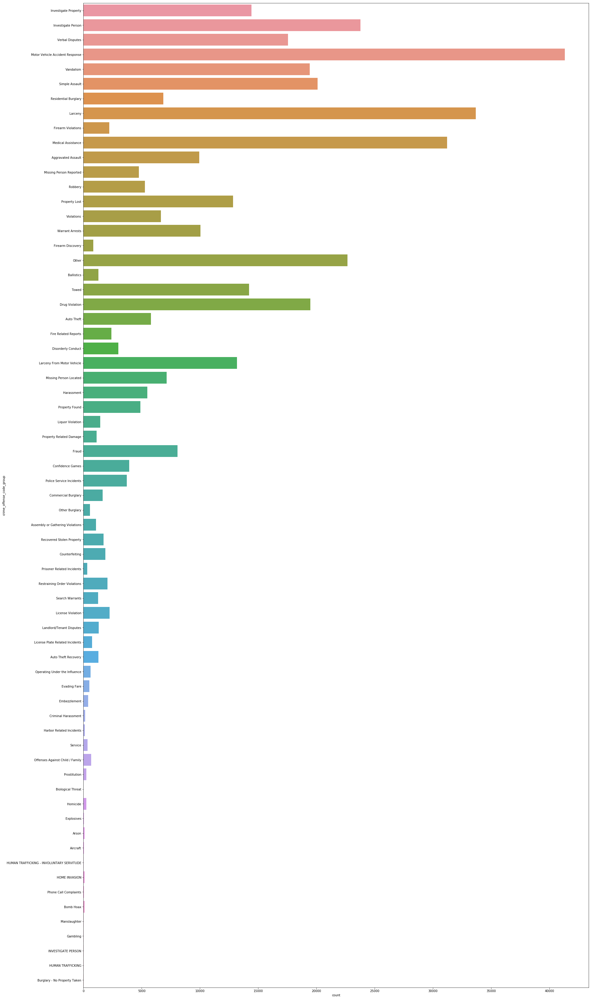

In [14]:
plt.figure(figsize=(30, 60))    #We are giving the size of figure
sns.countplot(y=crime.crime_offense_code_group)  #countplot taking counts of the columns which you choose 
plt.show()

From the plot above we see that the crime code group with the most crime reported is "Motor Vehicle Accident Response". We think it will be benificial to discard instances from this category since they are accidents. There are also quite a few instances categorized as "Medical Assistance" which will be disgarded as well. 

In [15]:
crime[["crime_offense_code", "crime_offense_description"]].groupby("crime_offense_code").sum()

,crime_offense_description
crime_offense_code,
111,"MURDER, NON-NEGLIGIENT MANSLAUGHTERMURDER, NON..."
112,KILLING OF FELON BY POLICE
121,MANSLAUGHTER - VEHICLE - NEGLIGENCEMANSLAUGHTE...
123,MANSLAUGHTER - NON-VEHICLE - NEGLIGENCEMANSLAU...
301,ROBBERY - STREETROBBERY - STREETROBBERY - STRE...
311,ROBBERY - COMMERCIALROBBERY - COMMERCIALROBBER...
315,ROBBERY - KNIFE - STREET
335,ROBBERY - UNARMED - CHAIN STOREROBBERY - UNARM...
339,ROBBERY - UNARMED - STREETROBBERY - UNARMED - ...


In [16]:
#crime.groupby(['crime_offense_code_group']).sum()
#crime.groupby(['crime_offense_code', 'crime_offense_code_group']).sum()

The violent list is all those as given above that are subjectively violent towards another person, with intent.
They do not include burglary or larceny, as it is assumed that any harm done to victims would be
classified elsewhere. Home invasion (2010) is included, as its legal definition typically includes bodily
harm done. Human trafficking (sexual or otherwise) is included, but not prostitution, as sex workers are assumed
to have some amount of agency; also, the separate chage of human trafficking seems to imply a differentiation.

Police homicide (112), suicide (3008), and drug sick assists (1830-1832) are separated as they warrant
a separate evaluation.

Finally, elements which would be difficult to correlate are removed.

In [48]:
violent_list = [111, 301, 311, 315, 335, 339, 349, 351, 361, 
                371,381, 402, 403, 404, 413, 423, 432, 801, 
                802, 803, 1610, 1620, 2010, 2511, 2611]
manslaughter_list = [121, 123]
police_homicide_list = [112]
suicide_list = [3008]
drug_medical_assist_list = [1830, 1831, 1832]
removed_crimes_list = [121, 123, 670, 735, 770, 2003, 2004, 2005,
                       2900, 2905, 2906, 2907, 2910, 2914, 
                       3001, 3002, 3004, 3006, 3007] # and anything > 3008
all_other_removed_crimes_list = [x for x in crime.crime_offense_code if x > 3008]

non_violent_creation_list = violent_list + police_homicide_list + suicide_list + \
                            drug_medical_assist_list + removed_crimes_list + \
                            manslaughter_list + all_other_removed_crimes_list
# This is a set to reduce its size, as we only need one entry for each to filter against
non_violent_creation_list = set(non_violent_creation_list)

non_violent_crimes = crime.loc[~crime.crime_offense_code.isin(non_violent_creation_list)]
violent_crimes = crime.loc[crime.crime_offense_code.isin(violent_list)]
manslaughter = crime.loc[crime.crime_offense_code.isin(manslaughter_list)]
police_homicides = crime.loc[crime.crime_offense_code.isin(police_homicide_list)]
suicides = crime.loc[crime.crime_offense_code.isin(suicide_list)]
drug_medical_assists = crime.loc[crime.crime_offense_code.isin(drug_medical_assist_list)]

combined_crimes = crime.loc[~crime.crime_offense_code.isin(all_other_removed_crimes_list)]
combined_crimes = crime.loc[~crime.crime_offense_code.isin(removed_crimes_list)]

In [60]:
bos_weather = []
for df in [humidity, temp, pressure, weather, wind_dir, wind_speed]:
    df = df.rename({"Boston":df.name}, axis=1)
    bos_weather.append(df)

In [105]:
### NOTE ###
# The following three cells were only to handle the original weather files, which contained many cities
# Code kept for posterity

In [106]:
# The files have many cities in them
#for df in bos_weather:
#    df.drop(list(df.filter(regex="^((?!Boston|datetime).)*$")), axis = 1, inplace=True)

In [107]:
# The scraper didn't specify the temp units, which inexplicably default to Kelvin
#def temp_k_to_f(kelvin):
#    return ((kelvin - 273.15) * 9/5 + 32)
#temp['Boston'] = temp['Boston'].apply(temp_k_to_f)

In [108]:
# And, to save upload space, let's write out our new files
#for df in bos_weather:
#    df.to_csv('./data/weather/' + df.name + '.csv')

In [68]:
# Same as a SQL inner join
weather = reduce(lambda left,right: pd.merge(left,right,on=["datetime"], how="inner"), bos_weather)
weather.drop(weather.filter(regex="[Uu]nnamed"), axis=1, inplace=True)
weather.rename(columns={'boston':'weather_description'}, inplace=True)
# First row is NaN due to the join, drop it
weather.drop(weather.index[0], inplace=True)

In [70]:
# There are still some NaNs, so let's fill them with the closest neighbor
weather.isna().any()

datetime               False
humidity                True
temperature             True
pressure                True
weather_description    False
wind_direction         False
wind_speed             False
dtype: bool

In [71]:
weather.fillna(method="ffill", inplace=True)
weather.isna().any()

datetime               False
humidity               False
temperature            False
pressure               False
weather_description    False
wind_direction         False
wind_speed             False
dtype: bool

In [69]:
### police ###

# None of the nulls here matter
police.isnull().any()

police_x               False
police_y               False
police_objectid        False
police_bldg_id         False
police_bid             False
police_address         False
police_point_x         False
police_point_y         False
police_name            False
police_neighborhood    False
police_city            False
police_zip             False
police_ft_sqft          True
police_story_ht         True
police_parcel_id       False
dtype: bool

In [70]:
### fire ###

# Lots of nulls here, but only ones that actually matter are fire_x and fire_y 
# (fire_xcoord and fire_ycoord are the same, but unsigned)
fire.isnull().any()

fire_x             False
fire_y             False
fire_objectid_1    False
fire_objectid       True
fire_bfd_id         True
fire_map_id         True
fire_mapcode        True
fire_loccode        True
fire_locdept        True
fire_locname        True
fire_loccontact     True
fire_locphone       True
fire_locstno        True
fire_locaddr       False
fire_locowner       True
fire_locward        True
fire_locparcl       True
fire_locprect       True
fire_locplan        True
fire_study          True
fire_above          True
fire_above_desc     True
fire_source         True
fire_geoaddress    False
fire_pd            False
fire_ct90           True
fire_xcoord         True
fire_ycoord         True
dtype: bool

In [71]:
### community ###

# None of the nulls here matter
community.isnull().any()

community_x           False
community_y           False
community_fid         False
community_objectid     True
community_site        False
community_phone       False
community_fax          True
community_street      False
community_neigh       False
community_zip         False
dtype: bool

In [72]:
### parks ###

# None of the nulls here matter
parks.isnull().any()

parks_objectid            False
parks_site_name           False
parks_ownership           False
parks_protection           True
parks_typecode            False
parks_district            False
parks_acres               False
parks_address             False
parks_zonagg              False
parks_typelong            False
parks_os_own_jur           True
parks_os_mngmnt            True
parks_pos                 False
parks_pa                  False
parks_alt_name             True
parks_agncyjuris           True
parks_shape_starea__      False
parks_shape_stlength__    False
parks_shapestarea         False
parks_shapestlength       False
parks_park_id              True
parks_region              False
dtype: bool

In [72]:
### weather ###

# No nulls, hooray
weather.isnull().any()

datetime               False
humidity               False
temperature            False
pressure               False
weather_description    False
wind_direction         False
wind_speed             False
dtype: bool

In [73]:
# Need to clean up datetime a bit for the next merge

# Ensure they're in datetime64 format
crime["datetime"] = pd.to_datetime(crime["datetime"].str.replace(".", ":"))
weather["datetime"] = pd.to_datetime(weather["datetime"].str.replace(".", ":"))

# Sort by date
crime.sort_values(by="datetime", inplace=True)
weather.sort_values(by="datetime", inplace=True)

In [74]:
# Since the crime data is from 2015-2019, and weather from 2012-2017, we'd be throwing out
# a lot of data if we only joined on those. As such, we'll examine weather separately
# from the other data, which is assumed (big if) to be static

# Also to consider is the fact that some of the crime reports almost certainly had the
# hour either missing or filled in as 0 by default, so the weather may not always correlate

crime_with_weather = pd.merge_asof(
                                    crime, weather, 
                                    on="datetime", 
                                    direction="nearest",
                                    tolerance=pd.Timedelta("1 hour")
                                  )

In [75]:
# Drop the rows for which we don't have weather
crime_with_weather.dropna(subset=["humidity",
                                  "temperature",
                                  "pressure",
                                  "weather_description",
                                  "wind_direction",
                                  "wind_speed"], 
                          inplace=True)

---

### Violent crimes by hour per day of week

This lays to rest the thought that too many of the recorded crimes have 0000 marked down for time as a default.
Were that true, we would assume a relatively equal distribution at midnight between the days of the week. While weekdays are similar, there are differences - for example, Tuesday at midnight is ~410, whereas Wednesday is ~500.

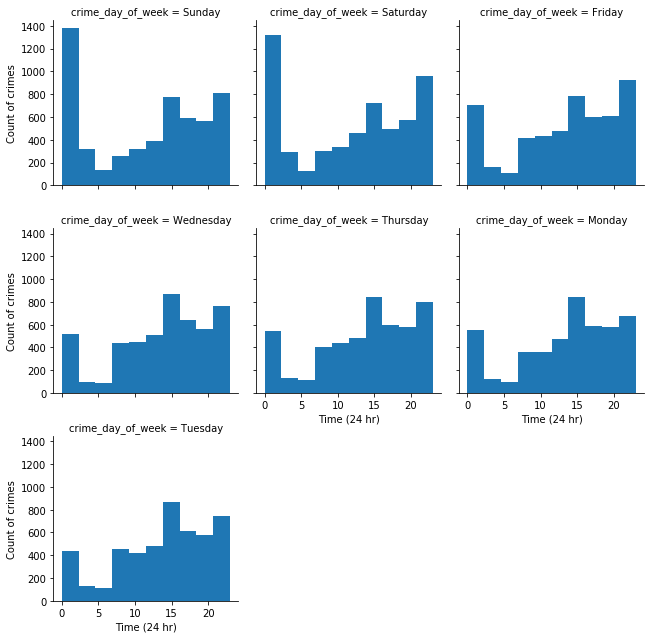

In [18]:
violent_dow_plot = sns.FacetGrid(violent_crimes, col='crime_day_of_week', col_wrap=3)
violent_dow_plot.map(plt.hist, 'crime_hour')
violent_dow_plot.set_axis_labels('Time (24 hr)', 'Count of crimes')

### Manslaughter by hour per day of week

There are not enough examples to make meaningful observations from.

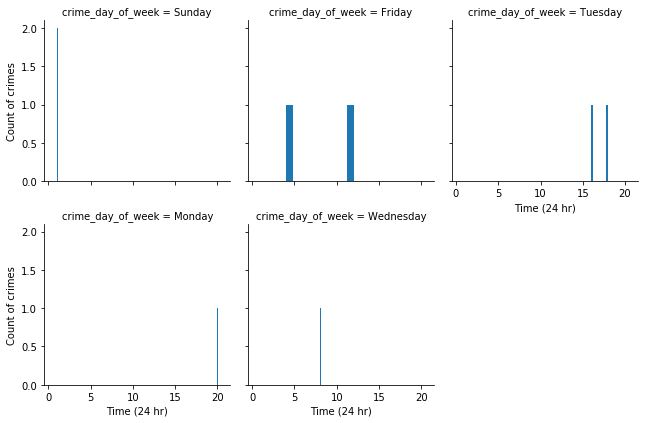

In [19]:
manslaughter_dow_plot = sns.FacetGrid(manslaughter, col='crime_day_of_week', col_wrap=3)
manslaughter_dow_plot.map(plt.hist, 'crime_hour')
manslaughter_dow_plot.set_axis_labels('Time (24 hr)', 'Count of crimes')

### Police homicide by hour per day of week

There are not enough examples to make meaningful observations from.

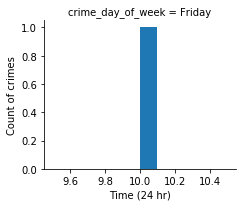

In [20]:
police_homicide_dow_plot = sns.FacetGrid(police_homicides, col='crime_day_of_week', col_wrap=3)
police_homicide_dow_plot.map(plt.hist, 'crime_hour')
police_homicide_dow_plot.set_axis_labels('Time (24 hr)', 'Count of crimes')

### Non-violent crimes by hour per day of week

Here we see a clear difference between non-violent and violent crimes. While both have spikes in the mid-afternoon, the weekend spike at midnight is far less pronounced for non-violent crimes.

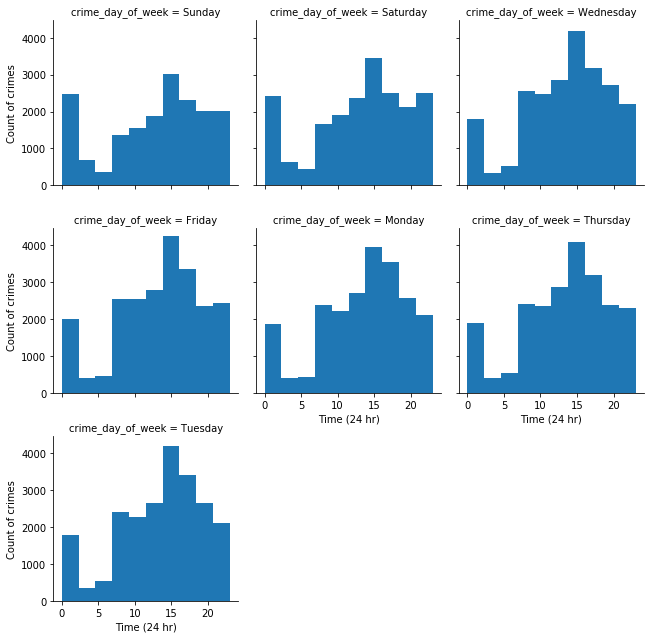

In [21]:
non_violent_dow_plot = sns.FacetGrid(non_violent_crimes, col='crime_day_of_week', col_wrap=3)
non_violent_dow_plot.map(plt.hist, 'crime_hour')
non_violent_dow_plot.set_axis_labels('Time (24 hr)', 'Count of crimes')

### Suicides by hour per day of week

There is an interesting shape which is roughly repeated across most days, with Saturday being a sharp outlier, and Wednesday to a lesser extent. In general, suicides become more frequent as the evening wears on.

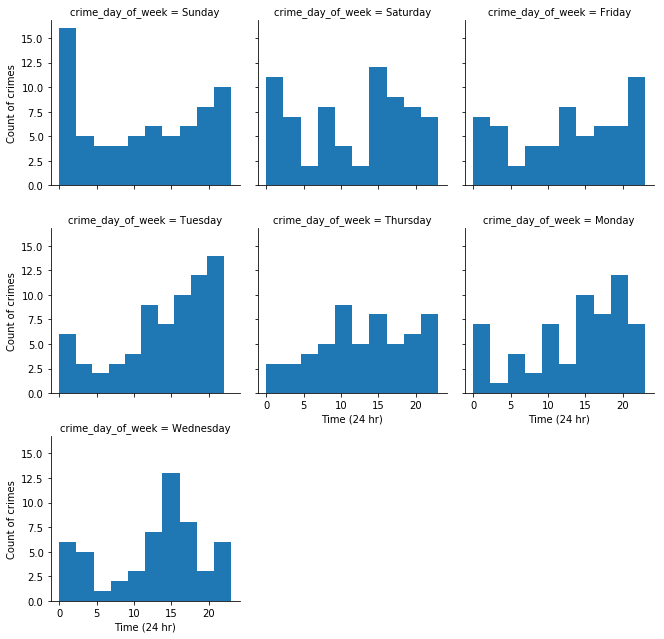

In [22]:
suicide_dow_plot = sns.FacetGrid(suicides, col='crime_day_of_week', col_wrap=3)
suicide_dow_plot.map(plt.hist, 'crime_hour')
suicide_dow_plot.set_axis_labels('Time (24 hr)', 'Count of crimes')

### Drug medical assistance by hour per day of week

Medical assistance due to drug overdose more or less follows suicides, which intuitively makes sense.

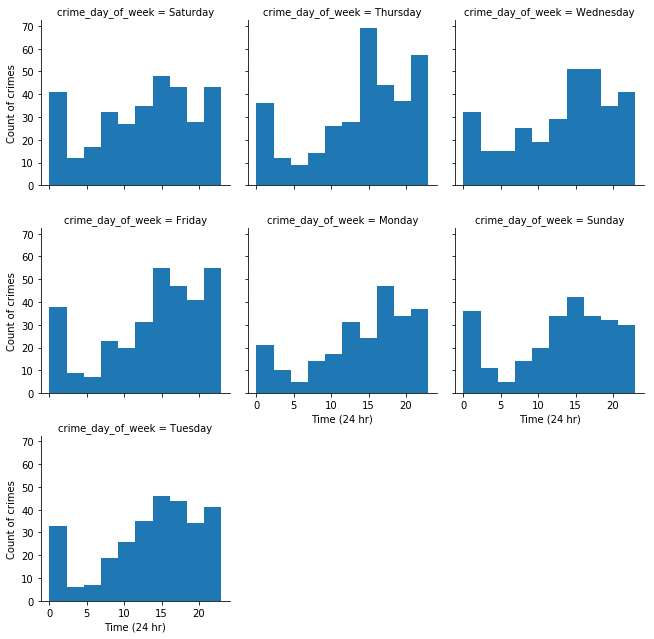

In [23]:
drug_assist_dow_plot = sns.FacetGrid(drug_medical_assists, col='crime_day_of_week', col_wrap=3)
drug_assist_dow_plot.map(plt.hist, 'crime_hour')
drug_assist_dow_plot.set_axis_labels('Time (24 hr)', 'Count of crimes')

---

In [49]:
combined_crimes

,crime_incident_number,crime_offense_code,crime_offense_code_group,crime_offense_description,crime_district,crime_reporting_area,crime_shooting,datetime,crime_year,crime_month,crime_day_of_week,crime_hour,crime_ucr_part,crime_street,crime_lat,crime_long,crime_location
0,I192078648,3114,Investigate Property,INVESTIGATE PROPERTY,B3,427,NaN,2019-09-29 06:39:00,2019,9,Sunday,6,Part Three,WILMORE ST,42.277964,-71.092463,"(42.27796370, -71.09246318)"
1,I192078647,3115,Investigate Person,INVESTIGATE PERSON,A1,,NaN,2019-09-29 03:45:00,2019,9,Sunday,3,Part Three,NASHUA ST,42.367690,-71.065863,"(42.36769032, -71.06586347)"
2,I192078645,3301,Verbal Disputes,VERBAL DISPUTE,B3,450,NaN,2019-09-29 06:00:00,2019,9,Sunday,6,Part Three,ASPINWALL RD,42.291816,-71.072441,"(42.29181580, -71.07244098)"
3,I192078642,3820,Motor Vehicle Accident Response,M/V ACCIDENT INVOLVING PEDESTRIAN - INJURY,D4,269,NaN,2019-09-29 05:50:00,2019,9,Sunday,5,Part Three,ALBANY ST,42.332419,-71.075013,"(42.33241896, -71.07501315)"
4,I192078640,3115,Investigate Person,INVESTIGATE PERSON,A7,28,NaN,2019-09-29 01:30:00,2019,9,Sunday,1,Part Three,PARIS ST,42.373392,-71.036478,"(42.37339168, -71.03647779)"
5,I192078638,1402,Vandalism,VANDALISM,A1,75,NaN,2019-09-29 04:46:00,2019,9,Sunday,4,Part Two,CAUSEWAY ST,42.364331,-71.063193,"(42.36433126, -71.06319318)"
6,I192078638,801,Simple Assault,ASSAULT - SIMPLE,A1,75,NaN,2019-09-29 04:46:00,2019,9,Sunday,4,Part Two,CAUSEWAY ST,42.364331,-71.063193,"(42.36433126, -71.06319318)"
7,I192078637,3114,Investigate Property,INVESTIGATE PROPERTY,E5,563,NaN,2019-09-29 04:57:00,2019,9,Sunday,4,Part Three,FIRTH RD,42.288617,-71.125800,"(42.28861715, -71.12579957)"
8,I192078636,521,Residential Burglary,BURGLARY - RESIDENTIAL - ATTEMPT,B2,316,NaN,2019-09-29 04:40:00,2019,9,Sunday,4,Part One,ABBOTSFORD ST,42.314630,-71.092615,"(42.31462973, -71.09261520)"
9,I192078635,3301,Verbal Disputes,VERBAL DISPUTE,B3,466,NaN,2019-09-28 23:55:00,2019,9,Saturday,23,Part Three,GOODALE RD,42.283628,-71.093496,"(42.28362830, -71.09349553)"


In [25]:
# Needed to show TSNE log
%load_ext wurlitzer

In [88]:
# Use this to download any tsne arrays you'd like to import for local use
# Import them using your_desired_var_name = np.genfromtxt('./data/output_file.csv', delimiter=',')

#combined_crimes_output = np.asarray(combined_crimes_tsne)
#np.savetxt("combined_crimes_output.csv", combined_crimes_output, delimiter=",")

In [50]:
combined_crimes_tsne_list = combined_crimes[['crime_offense_code', 'crime_year', 'crime_month', 'crime_hour', 
                                   'crime_lat', 'crime_long']]
#combined_crimes.datetime = [datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in combined_crimes.datetime]
tsne = TSNE(n_components=2)
combined_crimes_tsne = tsne.fit_transform(combined_crimes)

In [55]:
violent_crimes_tsne_list = violent_crimes[['crime_offense_code', 'crime_year', 'crime_month', 'crime_hour', 
                                   'crime_lat', 'crime_long']]
tsne = TSNE(n_components=2)
violent_crimes_tsne = tsne.fit_transform(violent_crimes_tsne_list)

In [92]:
non_violent_crimes_tsne_list = non_violent_crimes[['crime_offense_code', 'crime_year', 'crime_month', 'crime_hour', 
                                   'crime_lat', 'crime_long']]
tsne = TSNE(n_components=2)
non_violent_crimes_tsne = tsne.fit_transform(non_violent_crimes_tsne_list)

In [ ]:
non_violent_crimes_tsne_list = non_violent_crimes[['crime_offense_code', 'crime_year', 'crime_month', 'crime_hour', 
                                   'crime_lat', 'crime_long']]
tsne = TSNE(n_components=2)
non_violent_crimes_tsne = tsne.fit_transform(non_violent_crimes_tsne_list)

In [78]:
crime_with_weather_tsne_list = crime_with_weather[['crime_offense_code', 'crime_year', 'crime_month', 'crime_hour', 
                                                   'crime_lat', 'crime_long', 'humidity', 'temperature', 
                                                   'pressure', 'wind_speed', 'wind_direction']]
tsne = TSNE(n_components=2)
crime_with_weather_tsne = tsne.fit_transform(crime_with_weather_tsne_list)

## Combined Crimes TSNE Baseline

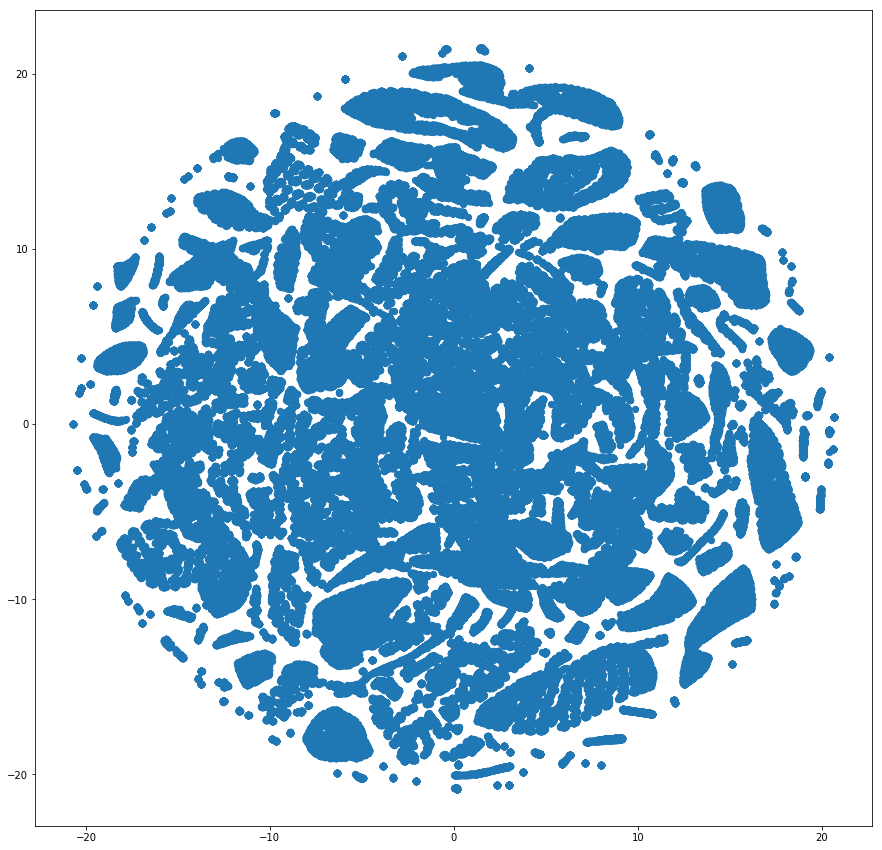

In [51]:
rcParams['figure.figsize'] = 15, 15
fig, ax = plt.subplots()
scatter = ax.scatter(combined_crimes_tsne[:,0],
                     combined_crimes_tsne[:,1],
                     cmap=plt.cm.PuOr,
                     s=40)

### Combined Crimes by Hour
Relatively little overlap in clustering

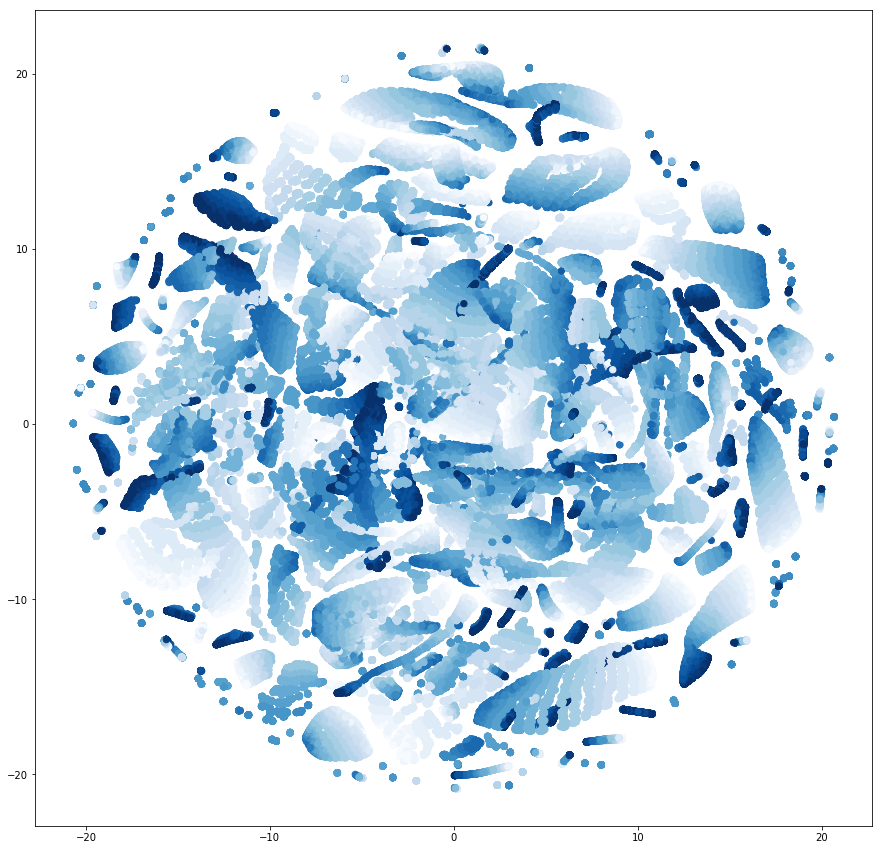

In [52]:
colvals = [x for x in combined_crimes.crime_hour]
minima = min(colvals)
maxima = max(colvals)
norm = matplotlib.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues_r)
mycolors = [mapper.to_rgba(v) for v in colvals]

rcParams['figure.figsize'] = 15, 15
fig, ax = plt.subplots()
scatter = ax.scatter(combined_crimes_tsne[:,0],
                     combined_crimes_tsne[:,1],
                     c=mycolors,
                     cmap=plt.cm.PuOr,
                     s=40)

### Combined Crimes by Latitude

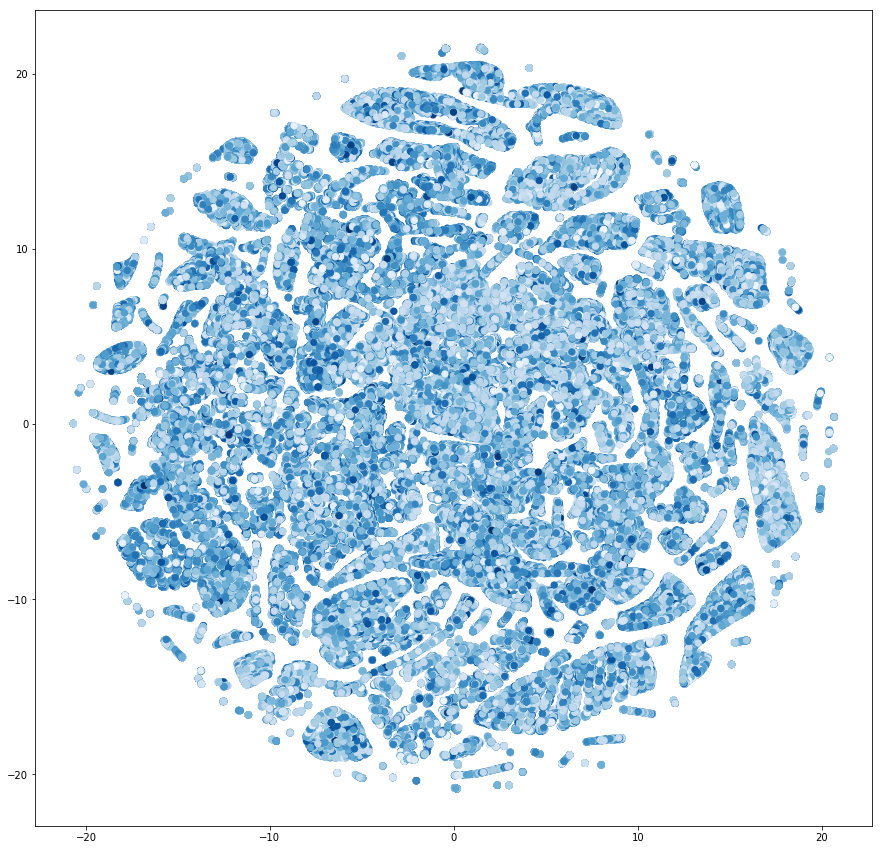

In [53]:
colvals = [x for x in combined_crimes.crime_lat]
minima = min(colvals)
maxima = max(colvals)
norm = matplotlib.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues_r)
mycolors = [mapper.to_rgba(v) for v in colvals]

rcParams['figure.figsize'] = 15, 15
fig, ax = plt.subplots()
scatter = ax.scatter(combined_crimes_tsne[:,0],
                     combined_crimes_tsne[:,1],
                     c=mycolors,
                     cmap=plt.cm.PuOr,
                     s=40)

### Combined Crimes by Longitude

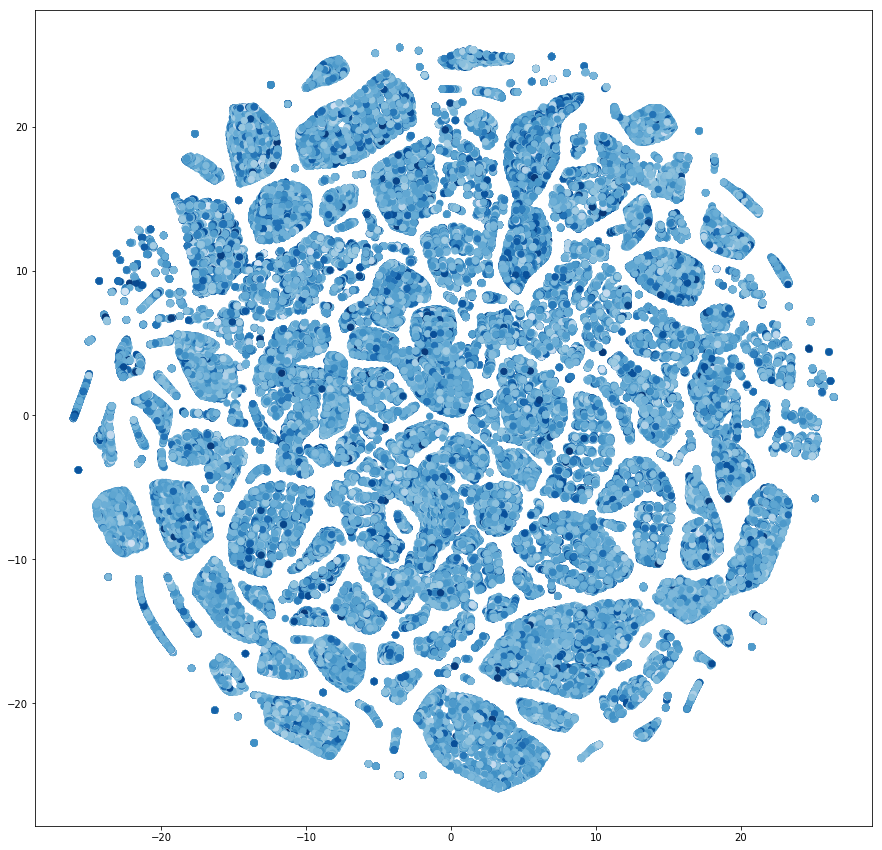

In [47]:
colvals = [x for x in combined_crimes.crime_long]
minima = min(colvals)
maxima = max(colvals)
norm = matplotlib.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues_r)
mycolors = [mapper.to_rgba(v) for v in colvals]

rcParams['figure.figsize'] = 15, 15
fig, ax = plt.subplots()
scatter = ax.scatter(combined_crimes_tsne[:,0],
                     combined_crimes_tsne[:,1],
                     c=mycolors,
                     cmap=plt.cm.PuOr,
                     s=40)

## Violent Crimes TSNE Baseline

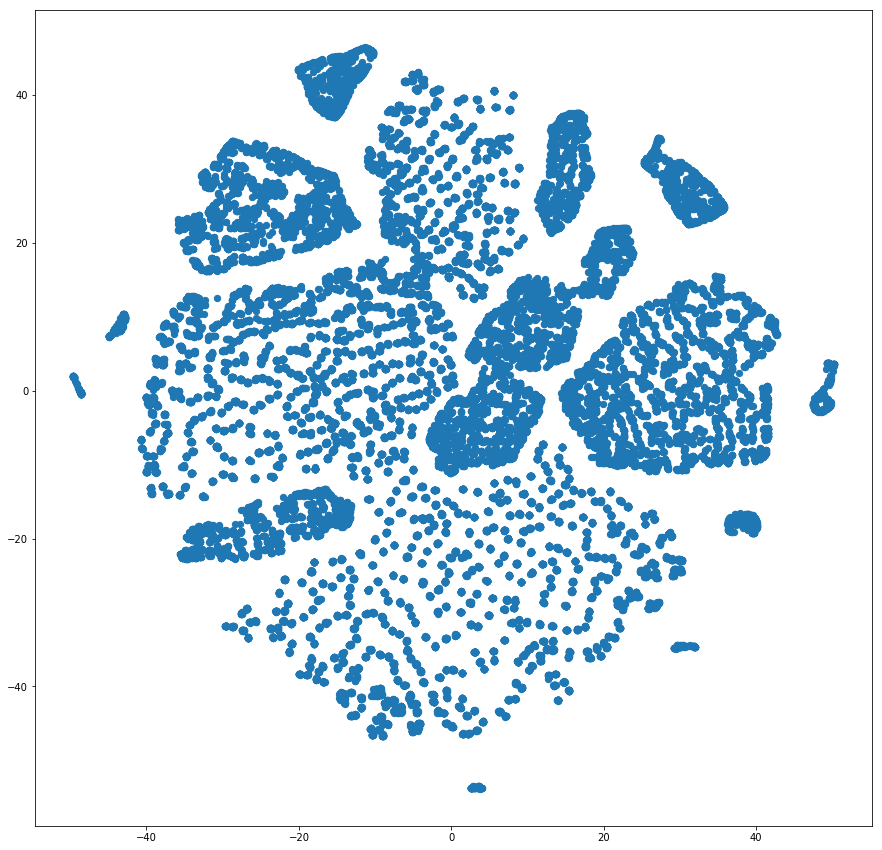

In [56]:
rcParams['figure.figsize'] = 15, 15
fig, ax = plt.subplots()
scatter = ax.scatter(violent_crimes_tsne[:,0],
                     violent_crimes_tsne[:,1],
                     cmap=plt.cm.PuOr,
                     s=40)

## Violent Crimes By Hour

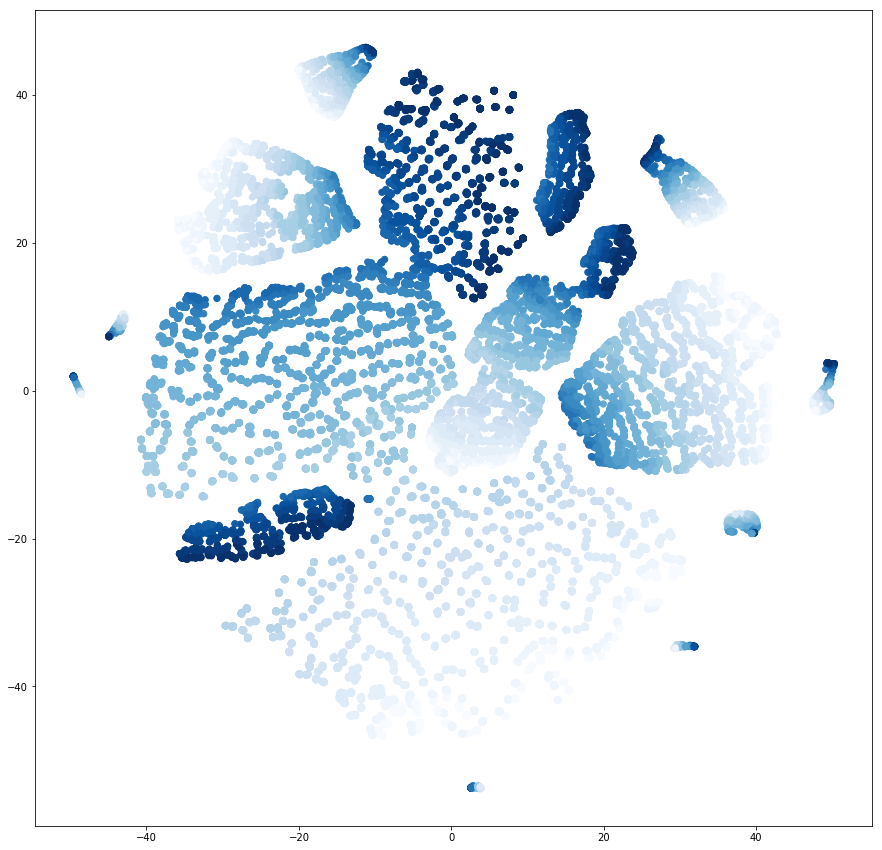

In [57]:
colvals = [x for x in violent_crimes.crime_hour]
minima = min(colvals)
maxima = max(colvals)
norm = matplotlib.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues_r)
mycolors = [mapper.to_rgba(v) for v in colvals]

rcParams['figure.figsize'] = 15, 15
fig, ax = plt.subplots()
scatter = ax.scatter(violent_crimes_tsne[:,0],
                     violent_crimes_tsne[:,1],
                     c=mycolors,
                     cmap=plt.cm.PuOr,
                     s=40)

## Violent Crimes By Latitude

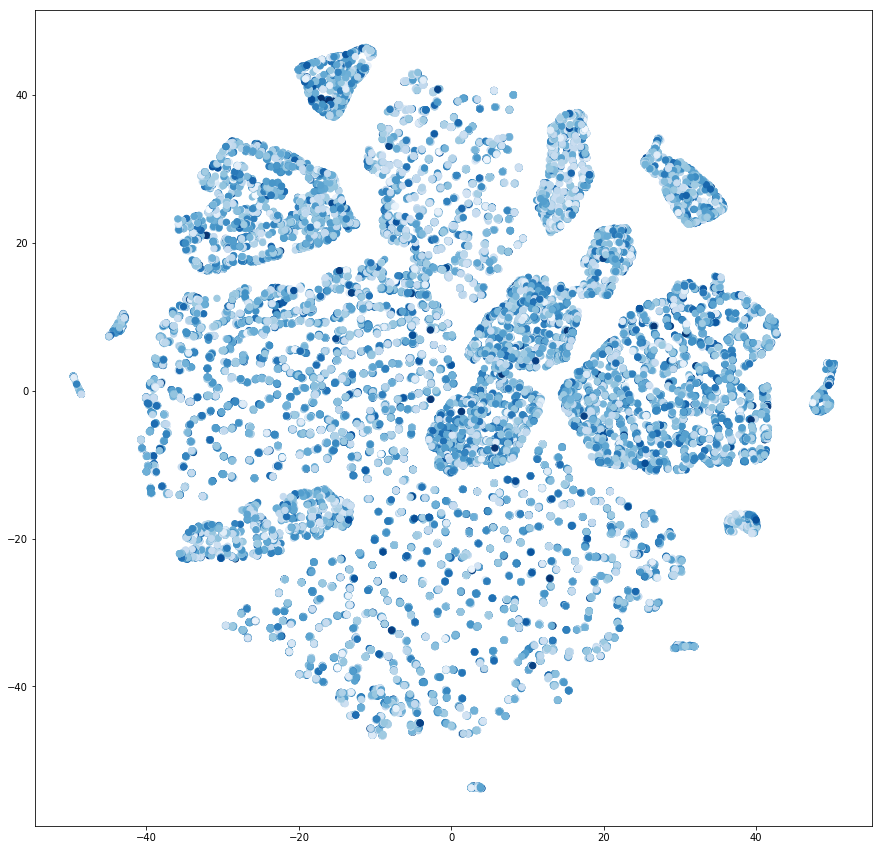

In [58]:
colvals = [x for x in violent_crimes.crime_lat]
minima = min(colvals)
maxima = max(colvals)
norm = matplotlib.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues_r)
mycolors = [mapper.to_rgba(v) for v in colvals]

rcParams['figure.figsize'] = 15, 15
fig, ax = plt.subplots()
scatter = ax.scatter(violent_crimes_tsne[:,0],
                     violent_crimes_tsne[:,1],
                     c=mycolors,
                     cmap=plt.cm.PuOr,
                     s=40)

## Violent Crimes By Longitude

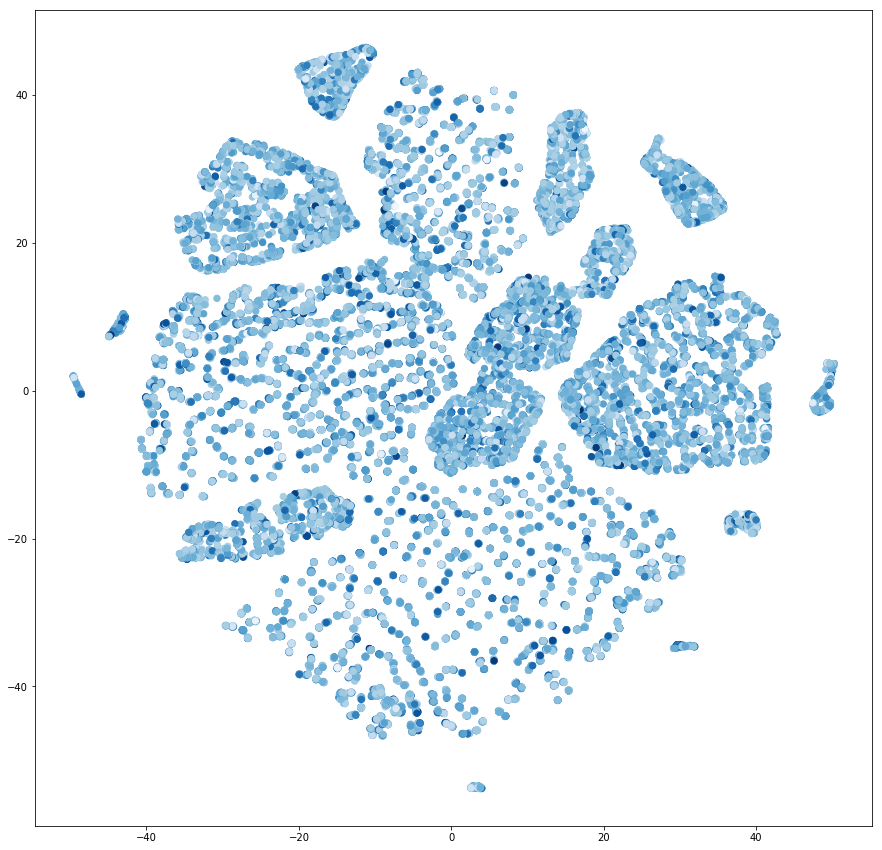

In [59]:
colvals = [x for x in violent_crimes.crime_long]
minima = min(colvals)
maxima = max(colvals)
norm = matplotlib.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues_r)
mycolors = [mapper.to_rgba(v) for v in colvals]

rcParams['figure.figsize'] = 15, 15
fig, ax = plt.subplots()
scatter = ax.scatter(violent_crimes_tsne[:,0],
                     violent_crimes_tsne[:,1],
                     c=mycolors,
                     cmap=plt.cm.PuOr,
                     s=40)

## Crime with Weather TSNE Baseline

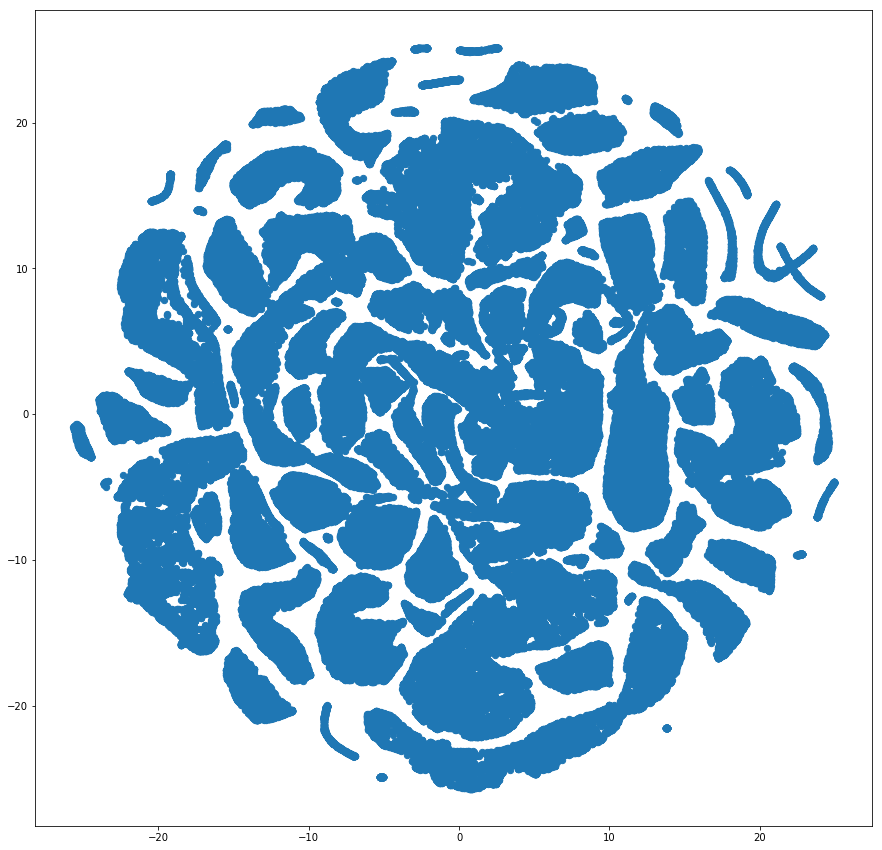

In [79]:
rcParams['figure.figsize'] = 15, 15
fig, ax = plt.subplots()
scatter = ax.scatter(crime_with_weather_tsne[:,0],
                     crime_with_weather_tsne[:,1],
                     cmap=plt.cm.PuOr,
                     s=40)

## Crimes With Weather By Hour

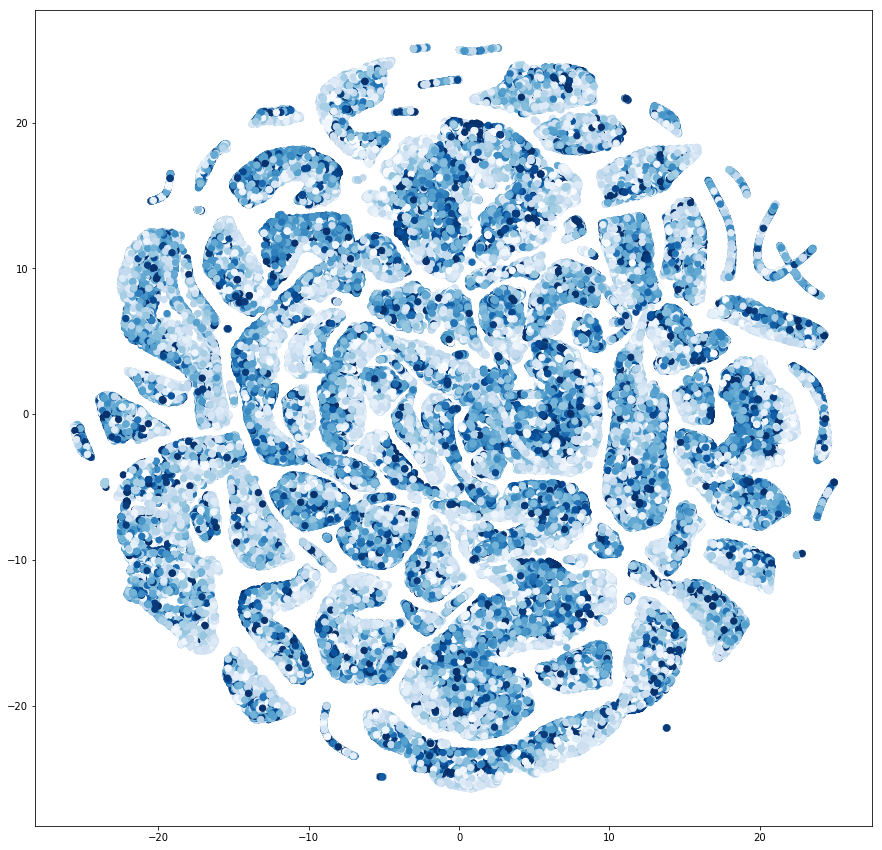

In [80]:
colvals = [x for x in crime_with_weather.crime_hour]
minima = min(colvals)
maxima = max(colvals)
norm = matplotlib.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues_r)
mycolors = [mapper.to_rgba(v) for v in colvals]

rcParams['figure.figsize'] = 15, 15
fig, ax = plt.subplots()
scatter = ax.scatter(crime_with_weather_tsne[:,0],
                     crime_with_weather_tsne[:,1],
                     c=mycolors,
                     cmap=plt.cm.PuOr,
                     s=40)

## Crimes With Weather By Latitude

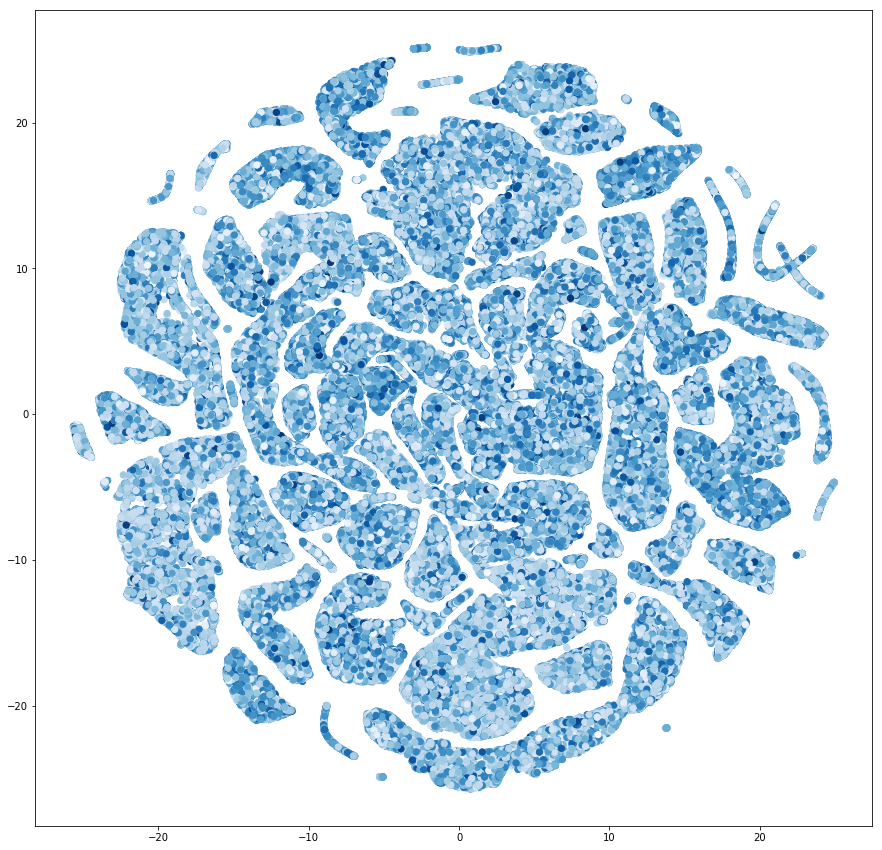

In [81]:
colvals = [x for x in crime_with_weather.crime_lat]
minima = min(colvals)
maxima = max(colvals)
norm = matplotlib.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues_r)
mycolors = [mapper.to_rgba(v) for v in colvals]

rcParams['figure.figsize'] = 15, 15
fig, ax = plt.subplots()
scatter = ax.scatter(crime_with_weather_tsne[:,0],
                     crime_with_weather_tsne[:,1],
                     c=mycolors,
                     cmap=plt.cm.PuOr,
                     s=40)

## Crimes With Weather By Longitude

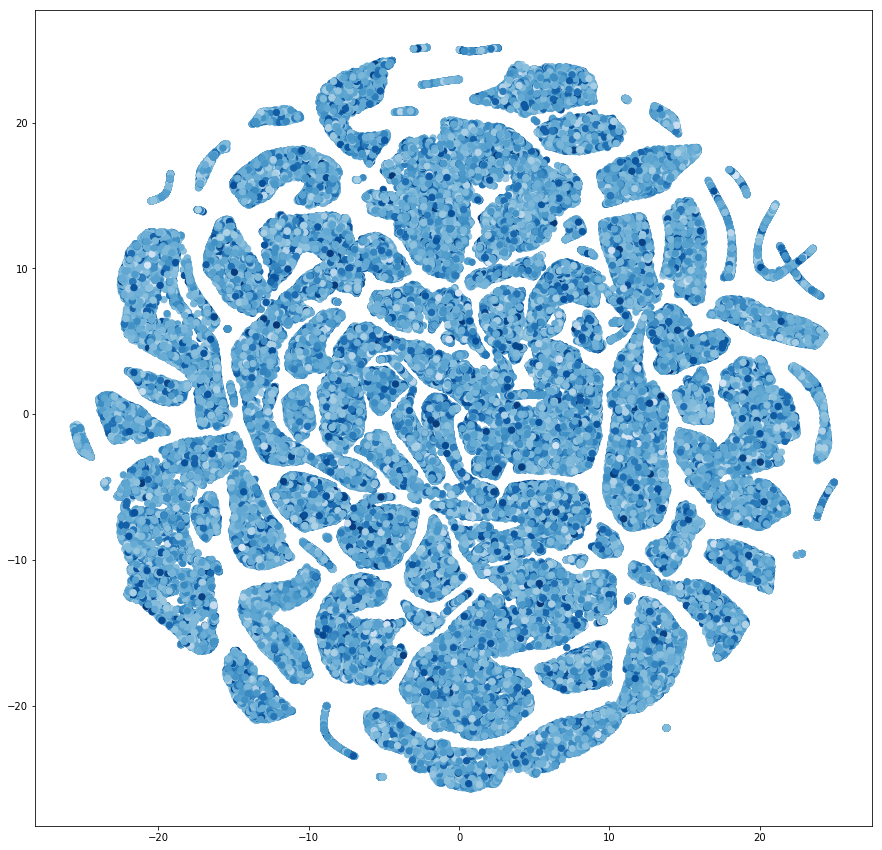

In [82]:
colvals = [x for x in crime_with_weather.crime_long]
minima = min(colvals)
maxima = max(colvals)
norm = matplotlib.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues_r)
mycolors = [mapper.to_rgba(v) for v in colvals]

rcParams['figure.figsize'] = 15, 15
fig, ax = plt.subplots()
scatter = ax.scatter(crime_with_weather_tsne[:,0],
                     crime_with_weather_tsne[:,1],
                     c=mycolors,
                     cmap=plt.cm.PuOr,
                     s=40)

## Crimes With Weather By Temperature

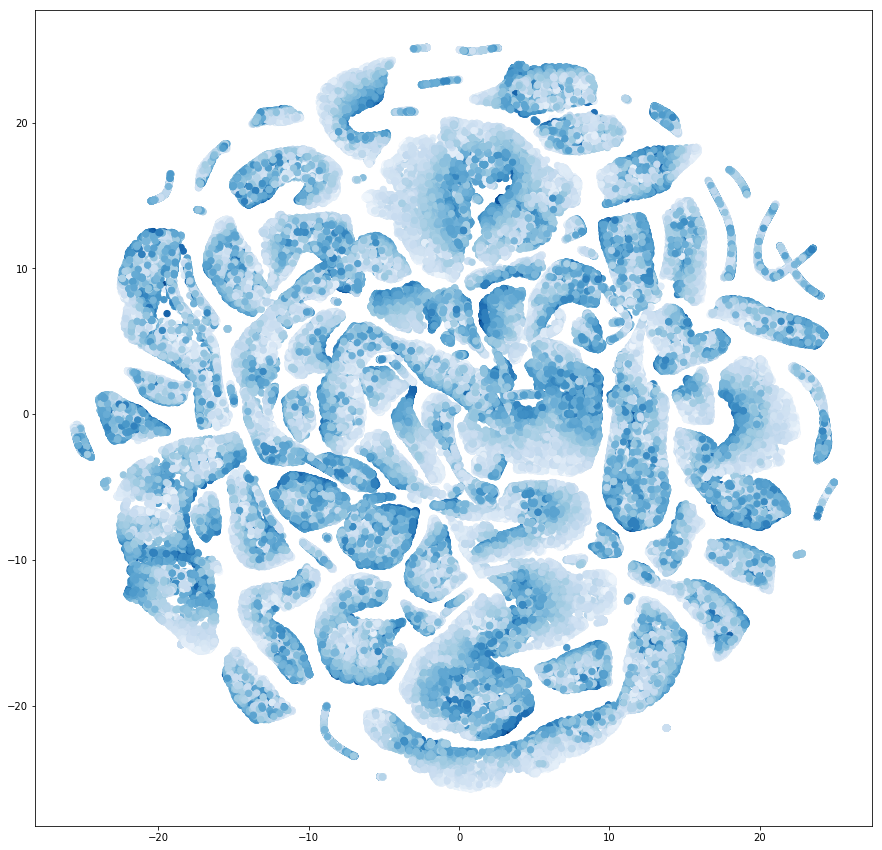

In [86]:
colvals = [x for x in crime_with_weather.temperature]
minima = min(colvals)
maxima = max(colvals)
norm = matplotlib.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues_r)
mycolors = [mapper.to_rgba(v) for v in colvals]

rcParams['figure.figsize'] = 15, 15
fig, ax = plt.subplots()
scatter = ax.scatter(crime_with_weather_tsne[:,0],
                     crime_with_weather_tsne[:,1],
                     c=mycolors,
                     cmap=plt.cm.PuOr,
                     s=40)

---

To better understand the crime data we will be using and inspire new datasets to add to our model, let's look at how hour of the day, day of the week, and month of the year affect the number of crimes reported.

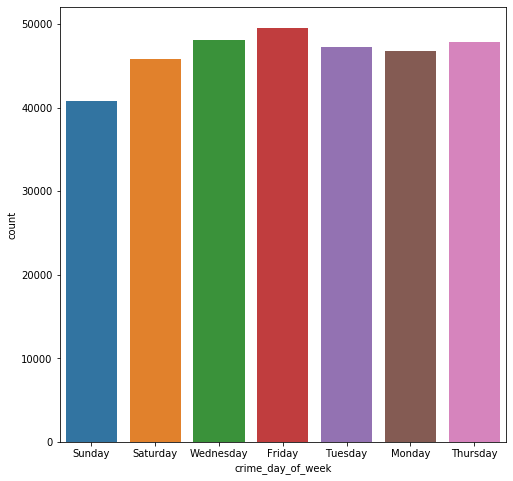

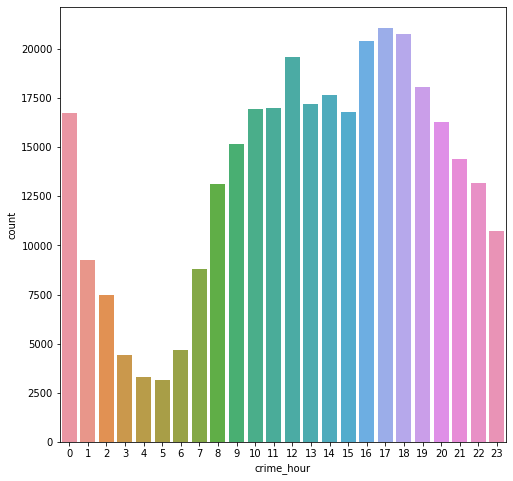

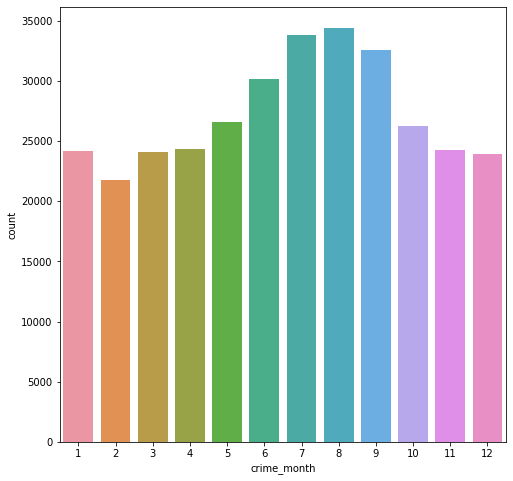

In [103]:
plt.figure(figsize=(8,8))    #We are giving the size of figure
sns.countplot(x=crime.crime_day_of_week)  #countplot taking counts of the columns which you choose 
plt.show() 

plt.figure(figsize=(8,8))    
sns.countplot(x=crime.crime_hour)  
plt.show() 

plt.figure(figsize=(8, 8))    
sns.countplot(x=crime.crime_month)  
plt.show()

# This is too big to graph as-is
#plt.figure(figsize=(8,8))    #We are giving the size of figure
#sns.countplot(x=crime.crime_occurred_on_date)  #countplot taking counts of the columns which you choose 
#plt.show() 

Looking at day of the week, we see that crime is most commonly reported on Fridays and least commonly seen on Sundays. Since Sundays have drastically less crimes reported, there could be a possible correlation between the location religious buildings and crime. Looking into hour of the day, crime appears to be reported most frequently between 4pm and 6pm and is reported the least between 3 am and 6 am. This observation indicates that it might be worth looking into the light density of various areas of the city if the data is available. Looking into the frequency of crimes reported by month, we see that crime is most common from June through September, and is least common in the month of February. There is a noticible increase in crime during Daylight Savings Time (between early March and early November). From these observations, it could be useful to include weather statistics in our model, as there appears to be a correlation between the season and crime frequency.

In [76]:
crime_with_weather.head()

,crime_incident_number,crime_offense_code,crime_offense_code_group,crime_offense_description,crime_district,crime_reporting_area,crime_shooting,datetime,crime_year,crime_month,crime_day_of_week,crime_hour,crime_ucr_part,crime_street,crime_lat,crime_long,crime_location,humidity,temperature,pressure,weather_description,wind_direction,wind_speed
0,I152067251,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,A1,93,NaN,2015-06-15,2015,6,Monday,0,Part Two,FANEUIL HALL SQ,42.360205,-71.056208,"(42.36020464, -71.05620816)",70.0,60.952634,1031.0,scattered clouds,137.0,3.0
1,I152049897,3201,Property Lost,PROPERTY - LOST,B2,282,NaN,2015-06-15,2015,6,Monday,0,Part Three,WASHINGTON ST,42.328663,-71.085634,"(42.32866284, -71.08563401)",70.0,60.952634,1031.0,scattered clouds,137.0,3.0
2,I152051083,3115,Investigate Person,INVESTIGATE PERSON,A7,20,NaN,2015-06-15,2015,6,Monday,0,Part Three,PARIS ST,42.377023,-71.032247,"(42.37702319, -71.03224730)",70.0,60.952634,1031.0,scattered clouds,137.0,3.0
3,I172040657,2629,Harassment,HARASSMENT,C11,397,NaN,2015-06-15,2015,6,Monday,0,Part Two,MELBOURNE ST,42.291093,-71.065945,"(42.29109287, -71.06594539)",70.0,60.952634,1031.0,scattered clouds,137.0,3.0
4,I152051083,3130,Search Warrants,SEARCH WARRANT,A7,20,NaN,2015-06-15,2015,6,Monday,0,Part Three,PARIS ST,42.377023,-71.032247,"(42.37702319, -71.03224730)",70.0,60.952634,1031.0,scattered clouds,137.0,3.0


With weather in the crime data frame we can plot how the frequency of crime depends on temperature. For this we will round temperature to the nearest whole number.

We see a significant increase in crime when temperatures are above freezing and below 85 degrees fahrenheit. We can also plot crime instances against the weather description.

When plotting against the weather description we see that an overwhelming amount of crime happens when there are clear skies. 

In [ ]:
coords = []
for x, y in zip(crime.crime_long.tail(1000), crime.crime_lat.tail(1000)):
    coords.append((x,y))

NameError: name 'coords' is not defined

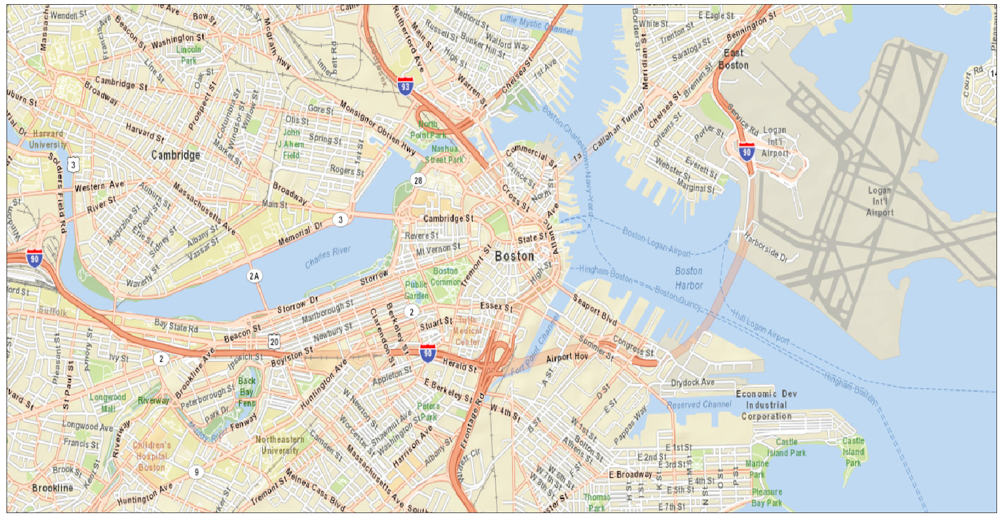

In [111]:
"""
Generates a map of Boston and plots crime locations as taken from previous cell.

Basemap:
* epsg is European Petroleum Survey Group; a common way of identifying map datums - for example,
  epsg wgs84 is a global datum which Google Maps uses. Using it for this would add additional difficulty,
  as such, 2805 (a Boston mainland specific datum) is used.
* projection being used is Mercator, which is unfortunately the best cylindrical conformal map available to Basemap.
* lon_0/lat_0 are the center of the map.
* llcrnrlon/lat is lon/lat of the lower-left map boundary.
* urcrnrlon/lat is the lon/lat of the upper-right map boundary.

arcgisimage:
* service: actually provides the map image.
* xpixels: sets horizontal resolution; vertical is inferred.
* verbose: if true, returns URL as well.

scatter:
* x: longitude from coords
* y: latitude from coords
* marker: marker style
* color: color
* s: size in pixels
"""

plt.figure(figsize=(30,30))
map = Basemap(
                epsg=2805,
                resolution='i',
                projection='merc',
                lon_0=-71.057083,
                lat_0=42.361145,
                llcrnrlon=-71.125305,
                llcrnrlat=42.332037,
                urcrnrlon=-70.991678,
                urcrnrlat=42.382334
            )
map.arcgisimage(service='ESRI_StreetMap_World_2D', xpixels=1500, verbose=False)
for x, y in coords:
    map.scatter(x, y, latlon=True, marker='o', color='r', s=80)
plt.show()

In [ ]:
# https://github.com/drazenz/heatmap/blob/master/heatmap.py

def heatmap(x, y, **kwargs):
    if 'color' in kwargs:
        color = kwargs['color']
    else:
        color = [1]*len(x)

    if 'palette' in kwargs:
        palette = kwargs['palette']
        n_colors = len(palette)
    else:
        n_colors = 256 # Use 256 colors for the diverging color palette
        palette = sns.color_palette("Blues", n_colors) 

    if 'color_range' in kwargs:
        color_min, color_max = kwargs['color_range']
    else:
        color_min, color_max = min(color), max(color) # Range of values that will be mapped to the palette, i.e. min and max possible correlation

    def value_to_color(val):
        if color_min == color_max:
            return palette[-1]
        else:
            val_position = float((val - color_min)) / (color_max - color_min) # position of value in the input range, relative to the length of the input range
            val_position = min(max(val_position, 0), 1) # bound the position betwen 0 and 1
            ind = int(val_position * (n_colors - 1)) # target index in the color palette
            return palette[ind]

    if 'size' in kwargs:
        size = kwargs['size']
    else:
        size = [1]*len(x)

    if 'size_range' in kwargs:
        size_min, size_max = kwargs['size_range'][0], kwargs['size_range'][1]
    else:
        size_min, size_max = min(size), max(size)

    size_scale = kwargs.get('size_scale', 500)

    def value_to_size(val):
        if size_min == size_max:
            return 1 * size_scale
        else:
            val_position = (val - size_min) * 0.99 / (size_max - size_min) + 0.01 # position of value in the input range, relative to the length of the input range
            val_position = min(max(val_position, 0), 1) # bound the position betwen 0 and 1
            return val_position * size_scale
    if 'x_order' in kwargs: 
        x_names = [t for t in kwargs['x_order']]
    else:
        x_names = [t for t in sorted(set([v for v in x]))]
    x_to_num = {p[1]:p[0] for p in enumerate(x_names)}

    if 'y_order' in kwargs: 
        y_names = [t for t in kwargs['y_order']]
    else:
        y_names = [t for t in sorted(set([v for v in y]))]
    y_to_num = {p[1]:p[0] for p in enumerate(y_names)}

    plot_grid = plt.GridSpec(1, 15, hspace=0.2, wspace=0.1) # Setup a 1x10 grid
    ax = plt.subplot(plot_grid[:,:-1]) # Use the left 14/15ths of the grid for the main plot

    marker = kwargs.get('marker', 's')

    kwargs_pass_on = {k:v for k,v in kwargs.items() if k not in [
         'color', 'palette', 'color_range', 'size', 'size_range', 'size_scale', 'marker', 'x_order', 'y_order'
    ]}

    ax.scatter(
        x=[x_to_num[v] for v in x],
        y=[y_to_num[v] for v in y],
        marker=marker,
        s=[value_to_size(v) for v in size], 
        c=[value_to_color(v) for v in color],
        **kwargs_pass_on
    )
    ax.set_xticks([v for k,v in x_to_num.items()])
    ax.set_xticklabels([k for k in x_to_num], rotation=45, horizontalalignment='right')
    ax.set_yticks([v for k,v in y_to_num.items()])
    ax.set_yticklabels([k for k in y_to_num])

    ax.grid(False, 'major')
    ax.grid(True, 'minor')
    ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
    ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)

    ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5])
    ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])
    ax.set_facecolor('#F1F1F1')

    # Add color legend on the right side of the plot
    if color_min < color_max:
        ax = plt.subplot(plot_grid[:,-1]) # Use the rightmost column of the plot

        col_x = [0]*len(palette) # Fixed x coordinate for the bars
        bar_y=np.linspace(color_min, color_max, n_colors) # y coordinates for each of the n_colors bars

        bar_height = bar_y[1] - bar_y[0]
        ax.barh(
            y=bar_y,
            width=[5]*len(palette), # Make bars 5 units wide
            left=col_x, # Make bars start at 0
            height=bar_height,
            color=palette,
            linewidth=0
        )
        ax.set_xlim(1, 2) # Bars are going from 0 to 5, so lets crop the plot somewhere in the middle
        ax.grid(False) # Hide grid
        ax.set_facecolor('white') # Make background white
        ax.set_xticks([]) # Remove horizontal ticks
        ax.set_yticks(np.linspace(min(bar_y), max(bar_y), 3)) # Show vertical ticks for min, middle and max
        ax.yaxis.tick_right() # Show vertical ticks on the right 


def corrplot(data, size_scale=500, marker='s'):
    corr = pd.melt(data.reset_index(), id_vars='index')
    corr.columns = ['x', 'y', 'value']
    heatmap(
        corr['x'], corr['y'],
        color=corr['value'], color_range=[-1, 1],
        palette=sns.diverging_palette(20, 220, n=256),
        size=corr['value'].abs(), size_range=[0,1],
        marker=marker,
        x_order=data.columns,
        y_order=data.columns[::-1],
        size_scale=size_scale
    )


In [ ]:
police_copy = police
crime_copy = crime
police_copy.columns = police_copy.columns.str.replace("police_x", "long")
police_copy.columns = police_copy.columns.str.replace("police_y", "lat")
police_copy.sort_values("long", inplace=True)
crime_copy.sort_values("crime_long", inplace=True)
police_sta_crime = pd.merge_asof(
                                    police_copy, crime, 
                                    left_on="long",
                                    right_on="crime_long",
                                    direction="nearest",
                                  )
plt.figure(figsize=(10, 10))
corrplot(crime_with_weather.corr())

In [ ]:
pd.set_option('display.max_rows', df.shape[0]+1)
crime[["crime_offense_code", "crime_offense_description"]].groupby("crime_offense_code").sum()